In [1]:
import pandas as pd
from sklearn.cluster import KMeans
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import datetime
from sklearn.preprocessing import MinMaxScaler
import plotly.express as px
from sklearn import metrics
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.corpus import stopwords
import re
import math
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.metrics import pairwise_distances

In [2]:
#data = pd.read_csv('C:/Users/gulie/data.csv')
data = pd.read_csv('data_data.csv')
genre = pd.read_csv('data_w_genres.csv')
by_genre = pd.read_csv('data_by_genres.csv')
#by_artist = pd.read_csv('C:/Users/gulie/data_by_artist.csv')

In [3]:
#data['release_date']= pd.to_datetime(data['release_date'], errors='coerce')
#data['year'] = data['release_date'].apply(lambda time: time.year)
#data = data[data.year > 1999]


In [4]:
#data.to_csv('C:/Users/gulie/data_data.csv')

In [5]:
 data.head()

,Unnamed: 0,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
0,15606,0.285,2000,0.00239,Coldplay,0.429,266773,0.661,0,3AJwUDP919kvQ9QcozQPxg,0.000121,11,0.2340,-7.227,1,Yellow,84,2000-07-10,0.0281,173.372
1,15607,0.613,2000,0.14300,OutKast,0.843,270507,0.806,1,0I3q5fE6wg7LIfHGngUTnV,0.000000,4,0.0771,-5.946,0,Ms. Jackson,80,2000-10-31,0.2690,94.948
2,15608,0.400,2000,0.00958,Linkin Park,0.556,216880,0.864,0,60a0Rd6pjrkxjPbaKzXjfq,0.000000,3,0.2090,-5.870,0,In the End,84,2000-10-24,0.0584,105.143
3,15609,0.543,2000,0.00664,3 Doors Down,0.545,233933,0.865,0,6ZOBP3NvffbU4SZcrnt1k6,0.000011,11,0.1680,-5.708,0,Kryptonite,78,2000-01-01,0.0286,99.009
4,15610,0.760,2000,0.03020,Eminem,0.949,284200,0.661,1,3yfqSUWxFvZELEM4PmlwIR,0.000000,5,0.0454,-4.244,0,The Real Slim Shady,80,2000-05-23,0.0572,104.504


In [6]:
data['artists']=data.artists.apply(lambda x: x.strip('[]'))
data['artists']=data.artists.apply(lambda x: x.strip("''"))
#data['artists']=data.artists.apply(lambda x: x.strip(r'[^\w\s]+'))
#genre['artists']=genre.artists.apply(lambda x: x.strip('"" "'))

In [7]:
#all columns in genre dataset removed and only genres and artists remain

data = data.explode("artists",ignore_index=True)
gcolumns = [x for x in genre.columns]

gcolumns = gcolumns[2:]
genre.drop(labels=gcolumns,axis=1,inplace=True)

genre.head()

,genres,artists
0,show tunes,"""Cats"" 1981 Original London Cast"
1,[],"""Cats"" 1983 Broadway Cast"
2,[],"""Fiddler On The Roof” Motion Picture Chorus"
3,[],"""Fiddler On The Roof” Motion Picture Orchestra"
4,[],"""Joseph And The Amazing Technicolor Dreamcoat""..."


In [8]:
# merge genres on artists
data = data.merge(genre,on='artists',how='left')

#remove null and non a number values
def remove_null(L):
    
    if type(L) == float:
        if math.isnan(L):
            return []
    else: 
        return L
data["genres"] = data["genres"].apply(remove_null)

In [9]:
data.head()

,Unnamed: 0,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,...,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,genres
0,15606,0.285,2000,0.00239,Coldplay,0.429,266773,0.661,0,3AJwUDP919kvQ9QcozQPxg,...,11,0.2340,-7.227,1,Yellow,84,2000-07-10,0.0281,173.372,"permanent wave, pop"
1,15607,0.613,2000,0.14300,OutKast,0.843,270507,0.806,1,0I3q5fE6wg7LIfHGngUTnV,...,4,0.0771,-5.946,0,Ms. Jackson,80,2000-10-31,0.2690,94.948,"atl hip hop, dirty south rap, hip hop, rap, so..."
2,15608,0.400,2000,0.00958,Linkin Park,0.556,216880,0.864,0,60a0Rd6pjrkxjPbaKzXjfq,...,3,0.2090,-5.870,0,In the End,84,2000-10-24,0.0584,105.143,"alternative metal, nu metal, post-grunge, rap ..."
3,15609,0.543,2000,0.00664,3 Doors Down,0.545,233933,0.865,0,6ZOBP3NvffbU4SZcrnt1k6,...,11,0.1680,-5.708,0,Kryptonite,78,2000-01-01,0.0286,99.009,"alternative metal, nu metal, pop rock, post-gr..."
4,15610,0.760,2000,0.03020,Eminem,0.949,284200,0.661,1,3yfqSUWxFvZELEM4PmlwIR,...,5,0.0454,-4.244,0,The Real Slim Shady,80,2000-05-23,0.0572,104.504,"detroit hip hop, hip hop, rap"


In [10]:
print(data['id'].info())

<class 'pandas.core.series.Series'>
Int64Index: 41450 entries, 0 to 41449
Series name: id
Non-Null Count  Dtype 
--------------  ----- 
41450 non-null  object
dtypes: object(1)
memory usage: 647.7+ KB
None


In [11]:
data.head()

,Unnamed: 0,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,...,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,genres
0,15606,0.285,2000,0.00239,Coldplay,0.429,266773,0.661,0,3AJwUDP919kvQ9QcozQPxg,...,11,0.2340,-7.227,1,Yellow,84,2000-07-10,0.0281,173.372,"permanent wave, pop"
1,15607,0.613,2000,0.14300,OutKast,0.843,270507,0.806,1,0I3q5fE6wg7LIfHGngUTnV,...,4,0.0771,-5.946,0,Ms. Jackson,80,2000-10-31,0.2690,94.948,"atl hip hop, dirty south rap, hip hop, rap, so..."
2,15608,0.400,2000,0.00958,Linkin Park,0.556,216880,0.864,0,60a0Rd6pjrkxjPbaKzXjfq,...,3,0.2090,-5.870,0,In the End,84,2000-10-24,0.0584,105.143,"alternative metal, nu metal, post-grunge, rap ..."
3,15609,0.543,2000,0.00664,3 Doors Down,0.545,233933,0.865,0,6ZOBP3NvffbU4SZcrnt1k6,...,11,0.1680,-5.708,0,Kryptonite,78,2000-01-01,0.0286,99.009,"alternative metal, nu metal, pop rock, post-gr..."
4,15610,0.760,2000,0.03020,Eminem,0.949,284200,0.661,1,3yfqSUWxFvZELEM4PmlwIR,...,5,0.0454,-4.244,0,The Real Slim Shady,80,2000-05-23,0.0572,104.504,"detroit hip hop, hip hop, rap"


In [12]:
by_genre.head()

,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,21st century classical,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.361600,-31.514333,0.040567,75.336500,0.103783,27.833333,6
1,1,432hz,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.131000,-16.854000,0.076817,120.285667,0.221750,52.500000,5
2,1,8-bit,0.762000,0.712000,1.151770e+05,0.818000,0.876000,0.126000,-9.180000,0.047000,133.444000,0.975000,48.000000,7
3,1,[],0.651417,0.529093,2.328809e+05,0.419146,0.205309,0.218696,-12.288965,0.107872,112.857352,0.513604,20.859882,7
4,1,a cappella,0.676557,0.538961,1.906285e+05,0.316434,0.003003,0.172254,-12.479387,0.082851,112.110362,0.448249,45.820071,7


In [13]:
c = 50
scaling = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters = c))])
X = by_genre.select_dtypes(np.number)
scaling.fit(X)
scaling = scaling.predict(X)
by_genre['cluster_genre'] = scaling

C:\Users\gulie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\manifold\_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\gulie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\manifold\_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.005s...
[t-SNE] Computed neighbors for 2973 samples in 0.206s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.777516
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.109856
[t-SNE] KL divergence after 1000 iterations: 1.392504


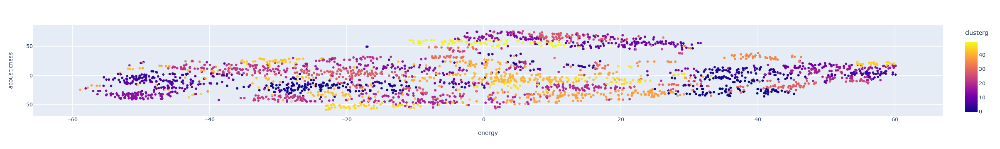

In [14]:
from sklearn.manifold import TSNE

tsne = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=1))])
genre_fit = tsne.fit_transform(X)
plot = pd.DataFrame(columns=['energy', 'acousticness'], data=genre_fit)
plot['genre'] = by_genre['genres']
plot['clusterg'] = by_genre['cluster_genre']

fig = px.scatter(
    plot, x='energy', y='acousticness', color='clusterg', hover_data=['energy', 'acousticness', 'genre'])
fig.show()

In [15]:
kmodel = Pipeline([('scaler', StandardScaler()), 
                     ('kmeans', KMeans(n_clusters=c, init='k-means++', random_state= 42))])

y = data.select_dtypes(np.number)
columns = list(y.columns)
kmodel= kmodel.fit(y)
kmodel = kmodel.predict(y)
data['cluster'] = kmodel

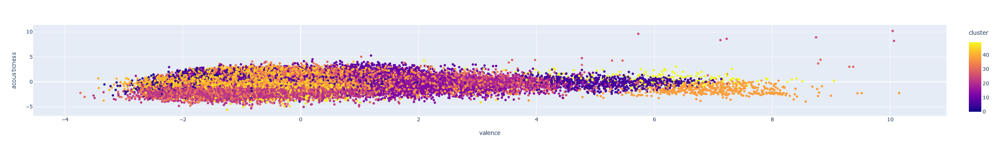

In [16]:
scale = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])

song_fit = scale.fit_transform(y)

scaled = pd.DataFrame(columns=['valence', 'acousticness'], data=song_fit)

scaled['artist'] = data['artists']

scaled['title'] = data['name']

scaled['date'] = data['year']

scaled['cluster'] = data['cluster']

scaled['popular'] = data['popularity']

scaled['tempo'] = data['tempo']

scaled['id'] = data['id']

fig = px.scatter(scaled, x='valence', y='acousticness', color='cluster', hover_data=['valence', 'acousticness', 'artist'])

fig.show()

In [17]:
#Cluster accuracy

kmeans_model = KMeans(n_clusters=c, init='k-means++', random_state= 42).fit(y)

labels = kmeans_model.labels_
silhouette_score(y, labels, metric = 'euclidean')


0.3510737444281389

### Cluster Accuracy using Silhuette Score ↓

<AxesSubplot: >

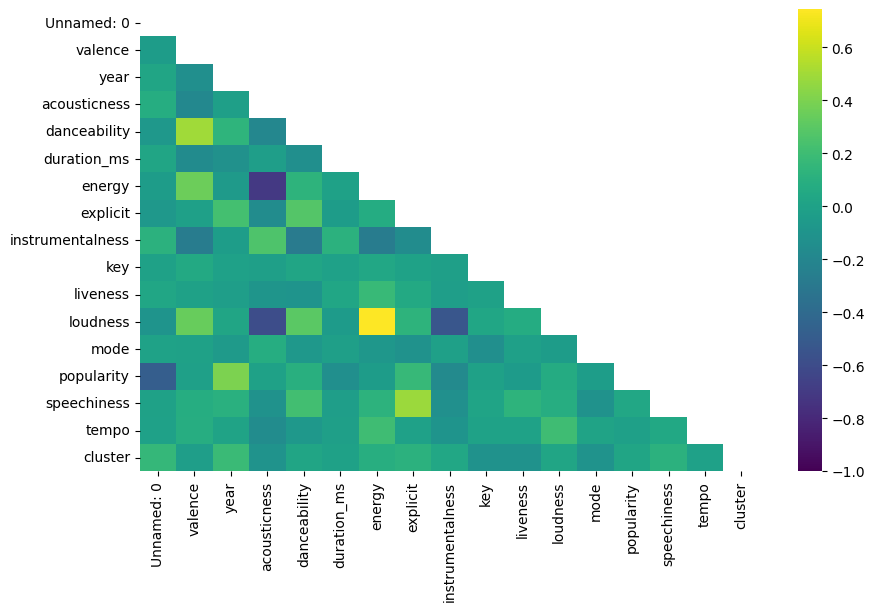

In [18]:
#sample_df = tracks[:20000]

plt.figure(figsize=(10,6))

corr = data.corr(numeric_only=True)
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr,mask=mask,vmin=-1,cmap='viridis',annot=False)
#pd.plotting.scatter_matrix(sample_df[['danceability', 'instrumentalness', 'energy', 'speechiness', 'valence', 'acousticness', ]], figsize=(20,12))


In [19]:
#dfs = scaled[scaled['popular']>45][['title','popular','date', 'cluster', 'tempo', 'acousticness']]
#fig = px.scatter(dfs,y='tempo', x='popular',color='cluster',size='popular')
#fig.show()

In [20]:
#displaying sample songs for each one of the clusters

df = pd.concat([plot,scaled], axis=1).set_index(scaled['cluster']).drop_duplicates()

for cluster in range(c):
    display(df.loc[cluster, ['title','cluster', 'artist', 'date', 'popular']].sample(frac=1).head(5))

,title,cluster,artist,date,popular
cluster,,,,,
0,They Don't Give A F**** About Us,0,"2Pac, Outlawz",2002,56
0,Die MF Die,0,Dope,2001,68
0,Into You (feat. Tamia),0,"Fabolous, Tamia",2003,69
0,Int'l Players Anthem (I Choose You) (feat. Out...,0,"UGK, OutKast",2014,58
0,Lonely,0,Akon,2006,47


,title,cluster,artist,date,popular
cluster,,,,,
1,The Reluctant Heroes,1,Hiroyuki Sawano,2013,57
1,The Authority Song,1,Jimmy Eat World,2001,45
1,聖者たち,1,People In The Box,2014,53
1,Estoy Enamorada,1,"Yolanda Pérez, Don Cheto",2003,48
1,Mistress,1,Disturbed,2002,41


,title,cluster,artist,date,popular
cluster,,,,,
2,Wake Me up When September Ends,2,Green Day,2004,77
2,Heartbeat,2,Carrie Underwood,2015,59
2,S&M,2,Rihanna,2010,72
2,Como Pez Sin Agua,2,Los Inquietos Del Norte,2008,55
2,The Mixed Tape - 2015 Remastered,2,"""Jacks Mannequin""",2005,49


,title,cluster,artist,date,popular
cluster,,,,,
3,Andromeda,3,Ghostemane,2016,62
3,You (feat. Tank),3,"Plies, Tank",2007,40
3,I'm Out (feat. Nicki Minaj),3,"Ciara, Nicki Minaj",2013,53
3,Yorktown (The World Turned Upside Down),3,Original Broadway Cast of Hamilton,2015,71
3,Off Dat,3,"Future, Lil Uzi Vert",2020,55


,title,cluster,artist,date,popular
cluster,,,,,
4,Warriors,4,"League of Legends, 2WEI, Edda Hayes",2020,75
4,When I Look At You,4,Miley Cyrus,2009,72
4,Desnuda,4,Ricardo Arjona,2012,61
4,Baby Blue Eyes,4,A Rocket To The Moon,2009,56
4,God With Us,4,MercyMe,2007,45


,title,cluster,artist,date,popular
cluster,,,,,
5,Beauty and the Beast,5,Jim Brickman,2005,42
5,Up 18 North,5,Kruger Brothers,2002,38
5,Reminiscence,5,Johannes Bornlöf,2016,64
5,As Ballad,5,Lambert,2015,55
5,Forget About,5,Sibylle Baier,2006,47


,title,cluster,artist,date,popular
cluster,,,,,
6,Good to Be Me (feat. Kid Rock) - South River R...,6,Uncle Kracker,2009,50
6,Free,6,Donavon Frankenreiter,2004,65
6,Gettin' You Home,6,Chris Young,2009,63
6,When Love Calls - Single Version,6,Atlantic Starr,2000,43
6,Amor de Internet,6,Los Socios Del Ritmo,2002,60


,title,cluster,artist,date,popular
cluster,,,,,
7,Pizza Day,7,The Aquabats!,2000,40
7,STARSTRUKK,7,3OH!3,2008,46
7,Trojans,7,Atlas Genius,2013,52
7,Feathers,7,Coheed and Cambria,2007,41
7,When You're Falling,7,Afro Celt Sound System,2001,42


,title,cluster,artist,date,popular
cluster,,,,,
8,Ni en Defensa Propia,8,Los Temerarios,2004,50
8,My City of Ruins,8,Bruce Springsteen,2002,50
8,Que Seas Feliz,8,Luis Miguel,2005,60
8,"Come On, Let's Go - Single Version",8,Ritchie Valens,2004,43
8,Tengo Que Olvidar,8,Banda Pachuco,2008,45


,title,cluster,artist,date,popular
cluster,,,,,
9,Spastik - Damolh33 Remix,9,Luke Shayer,2016,0
9,Now Move - Original Mix,9,Virustage,2014,0
9,Epic Motion - Original Mix,9,Yuji Ono,2019,0
9,Another Way,9,Aerospace,2018,0
9,Morning Star,9,Inference,2018,0


,title,cluster,artist,date,popular
cluster,,,,,
10,Shiver,10,Maroon 5,2002,46
10,"Stay or Leave - Live at Radio City Music Hall,...",10,"Dave Matthews, Tim Reynolds",2007,40
10,"Belief - Live at the Nokia Theatre, Los Angele...",10,John Mayer,2008,49
10,Six Strings Down,10,"Jimmie Vaughan, Eric Clapton, Bonnie Raitt, Ro...",2003,50
10,Puedo Imaginarme,10,Ricardo Rodriguez,2005,49


,title,cluster,artist,date,popular
cluster,,,,,
11,Imagine,11,Jack Johnson,2007,63
11,Not A Day Goes By,11,Lonestar,2001,46
11,Mellow Mood - feat. G. Love,11,"Slightly Stoopid, G. Love & Special Sauce",2003,51
11,Yo Te Extrañare,11,Tercer Cielo,2008,66
11,The Best Ever Death Metal Band in Denton,11,The Mountain Goats,2002,48


,title,cluster,artist,date,popular
cluster,,,,,
12,Motivated,12,NF,2015,52
12,Life,12,Bob Andy,2002,49
12,Space Hos,12,DANGERDOOM,2005,46
12,Enough Cryin,12,"Mary J. Blige, Brooklynn",2005,45
12,I'm an Albatraoz,12,AronChupa,2014,56


,title,cluster,artist,date,popular
cluster,,,,,
13,Burning,13,Sam Smith,2017,58
13,A Million Dreams,13,"Ziv Zaifman, Hugh Jackman, Michelle Williams",2017,76
13,Winter Wonderland,13,Hannah Kerr,2018,68
13,off the table (with The Weeknd),13,"Ariana Grande, The Weeknd",2020,72
13,I Don't Trust Nobody,13,"cucu, Shiloh",2017,60


,title,cluster,artist,date,popular
cluster,,,,,
14,"Dancing Through Life - From ""Wicked"" Original ...",14,"Stephen Schwartz, Norbert Leo Butz, Kristin Ch...",2003,40
14,Easy Silence,14,The Chicks,2006,47
14,Laputa,14,Panchiko,2000,40
14,獨家記憶,14,Jordan Chan,2008,56
14,My Last Name,14,Dierks Bentley,2003,39


,title,cluster,artist,date,popular
cluster,,,,,
15,El Tierno Se Fue,15,Calibre 50,2011,57
15,Make It Shine (Victorious Theme) (feat. Victor...,15,"Victorious Cast, Victoria Justice",2011,57
15,My Life Would Suck Without You,15,Kelly Clarkson,2009,67
15,Just the Way,15,"Parmalee, Blanco Brown",2019,73
15,Photograph,15,Nickelback,2005,68


,title,cluster,artist,date,popular
cluster,,,,,
16,Where Have You Been,16,Rihanna,2011,67
16,Cosmic Love,16,Florence + The Machine,2009,60
16,Are You Bored Yet? (feat. Clairo),16,"Wallows, Clairo",2019,86
16,"Hold On, We're Going Home",16,"Drake, Majid Jordan",2013,56
16,Chlorine,16,Twenty One Pilots,2018,77


,title,cluster,artist,date,popular
cluster,,,,,
17,...To Be Loved,17,Papa Roach,2006,53
17,Mr. Jack,17,System Of A Down,2002,60
17,Let It Rock,17,"Kevin Rudolf, Lil Wayne",2008,50
17,title track,17,Machine Gun Kelly,2020,70
17,Johnny Ringo,17,Crown The Empire,2011,47


,title,cluster,artist,date,popular
cluster,,,,,
18,Be Thou My Vision,18,4Him,2000,37
18,Love The Lonely Out Of You,18,Brothers Osborne,2014,49
18,How Did I Fall in Love with You,18,Backstreet Boys,2000,45
18,Minsan Lang Kitang Iibigin,18,Ariel Rivera,2000,50
18,Lodi,18,Jeffrey Foucault,2004,45


,title,cluster,artist,date,popular
cluster,,,,,
19,Poppin' - Main,19,Chris Brown,2005,54
19,Lone Digger,19,Caravan Palace,2015,60
19,Points of Authority,19,Linkin Park,2000,66
19,The Dark Of The Matinée,19,Franz Ferdinand,2004,54
19,The Fighter,19,"Keith Urban, Carrie Underwood",2016,64


,title,cluster,artist,date,popular
cluster,,,,,
20,Imperfect Flower,20,Quando Rondo,2019,59
20,Change Me,20,Danger Incorporated,2017,57
20,Triggered (freestyle),20,Jhené Aiko,2020,68
20,Down For Me (feat. 24hrs),20,"G-Eazy, Carnage, 24hrs",2017,58
20,Overwhelmed,20,Royal & the Serpent,2020,79


,title,cluster,artist,date,popular
cluster,,,,,
21,Fuck Her Brains Out,21,Montana of 300,2014,55
21,IMPORTED (with 6LACK),21,"Jessie Reyez, 6LACK",2020,65
21,Catch Hell,21,"Adam Calhoun, Katie Noel",2018,60
21,Cut Her Off,21,"K CAMP, 2 Chainz",2014,53
21,Déjà vu,21,TWENTY88,2016,52


,title,cluster,artist,date,popular
cluster,,,,,
22,One Take,22,Lil Tjay,2019,67
22,VIBEZ,22,DaBaby,2019,78
22,Facts,22,Kevin Gates,2019,60
22,Whole Lotta Choppas (Remix) [feat. Nicki Minaj],22,"Sada Baby, Nicki Minaj",2020,74
22,From The D To The A (feat. Lil Yachty),22,"Tee Grizzley, Lil Yachty",2017,72


,title,cluster,artist,date,popular
cluster,,,,,
23,Pavido Navido,23,Ponzoña Musical,2005,47
23,Que Te Ruegue Quien Te Quiera,23,Banda El Recodo,2008,61
23,A Mis Enemigos,23,Valentín Elizalde,2009,48
23,Right As Rain,23,Adele,2008,50
23,Return to Sender,23,Elvis Presley,2002,52


,title,cluster,artist,date,popular
cluster,,,,,
24,Drowning (feat. Kodak Black),24,"A Boogie Wit da Hoodie, Kodak Black",2017,76
24,The Morning,24,The Weeknd,2012,51
24,GAMES ON YOUR PHONE,24,24kGoldn,2019,68
24,Blow Your Mind (Mwah),24,Dua Lipa,2016,71
24,Soy Peor,24,Bad Bunny,2016,74


,title,cluster,artist,date,popular
cluster,,,,,
25,Brown Noise for Sleep,25,Sounds for Life,2009,42
25,Ocean Waves for Sleep,25,Ocean Waves For Sleep,2010,56
25,Midnight Thunderstorm Part 2,25,"Lightning, Thunder and Rain Storm",2009,43
25,Brown Noise - 90 Minutes,25,Sound Dreamer,2013,50
25,Aladdin - Storyteller,25,Chuck Riley,2004,42


,title,cluster,artist,date,popular
cluster,,,,,
26,Sleep Well Rain Sound,26,Rain Sounds For Sleep,2018,69
26,In the Forest Rain,26,Big Sounds,2017,66
26,Pouring Rain - Striking Thunder,26,Ambiworld,2019,65
26,Lost Keys (Blame Hofman),26,TOOL,2006,50
26,Northern Thunder,26,Shaman,2019,67


,title,cluster,artist,date,popular
cluster,,,,,
27,Pills,27,Joji,2018,62
27,Looking Too Closely,27,Fink,2014,64
27,Lazy Days,27,Enya,2000,46
27,White Christmas,27,Beegie Adair and Friends,2011,47
27,thinking of you,27,"mommy, Philanthrope, Kyle McEvoy",2018,71


,title,cluster,artist,date,popular
cluster,,,,,
28,Bite Down,28,Boyz N Da Hood,2007,40
28,Let Nas Down,28,J. Cole,2013,54
28,Juicy,28,"Doja Cat, Tyga",2019,64
28,Money and the Power,28,Kid Ink,2013,55
28,Terrorist Threats (feat. Danny Brown & Jhene A...,28,"Ab-Soul, Danny Brown, Jhené Aiko",2012,49


,title,cluster,artist,date,popular
cluster,,,,,
29,From A Table Away,29,Sunny Sweeney,2011,43
29,When You're Home,29,"Mandy Gonzalez, Christopher Jackson, ""In The H...",2008,46
29,Hoy Tengo Miedo,29,Fobia,2005,50
29,Come Back to Me,29,David Cook,2008,50
29,Heaven Knows,29,Five For Fighting,2013,54


,title,cluster,artist,date,popular
cluster,,,,,
30,Rain With Light Thunderstorm,30,Nature Sounds,2012,47
30,White Noise Fan for Babies,30,The White Noise,2011,56
30,"Music For Sleep Thunderstorm, Rain",30,"Sounds Of Nature : Thunderstorm, Rain",2009,54
30,Devi Prayer,30,Craig Pruess & Ananda,2002,61
30,432Hz Miracle Tone: Raise Positive Vibrations ...,30,PowerThoughts Meditation Club,2000,49


,title,cluster,artist,date,popular
cluster,,,,,
31,Beauty School,31,Deftones,2010,47
31,Define,31,"Dom Dolla, Go Freek",2015,59
31,No One,31,Cold,2000,43
31,I Can't Hear You,31,The Dead Weather,2010,48
31,Sonnentanz - Sun Don't Shine,31,"Klangkarussell, Will Heard",2013,50


,title,cluster,artist,date,popular
cluster,,,,,
32,EdEddnEddy,32,JID,2017,58
32,2 A.M.,32,King Von,2020,65
32,Flexin',32,Pop Smoke,2019,69
32,What'd I Miss,32,"Daveed Diggs, Leslie Odom Jr., Okieriete Onaod...",2015,70
32,Pretty Little Fears (feat. J. Cole),32,"6LACK, J. Cole",2018,76


,title,cluster,artist,date,popular
cluster,,,,,
33,How Do I Know,33,"Andrew Rayel, Jano",2013,0
33,Finally Found You,33,Flash Ki,2013,0
33,Forgive Myself,33,Sam Smith,2020,5
33,Grido in silenzio,33,Theatra,2018,0
33,Dummy Green,33,Kodak Black,2020,27


,title,cluster,artist,date,popular
cluster,,,,,
34,Love Generation - Radio Edit,34,"Bob Sinclar, Gary Pine",2005,64
34,Stanky Legg,34,GS Boyz,2009,40
34,Pídeme,34,Guaco,2005,52
34,Get Drunk And Be Somebody,34,Toby Keith,2006,43
34,10 A.M. Automatic,34,The Black Keys,2004,48


,title,cluster,artist,date,popular
cluster,,,,,
35,I Have Questions,35,Camila Cabello,2017,66
35,Erase My Scars,35,Evans Blue,2010,53
35,Thnks fr th Mmrs,35,Fall Out Boy,2007,50
35,Thank God I Found You (feat. Joe & Nas) - Make...,35,"Mariah Carey, Joe, Nas, Clue, Supa Engineer ""D...",2000,58
35,Ignorance,35,Paramore,2009,67


,title,cluster,artist,date,popular
cluster,,,,,
36,The Unknown,36,Crossfade,2004,46
36,Bad Wings,36,The Glitch Mob,2010,48
36,Chrome Country,36,Oneohtrix Point Never,2013,52
36,Blacklist,36,Exodus,2004,54
36,Kissing Families,36,Silversun Pickups,2005,50


,title,cluster,artist,date,popular
cluster,,,,,
37,Stay,37,"Rihanna, Mikky Ekko",2012,67
37,Ayala (Outro),37,XXXTENTACION,2017,64
37,One Day More,37,Les Misérables Cast,2013,51
37,Here with Me,37,"Susie Suh, Robot Koch",2014,56
37,Murders,37,Miracle Musical,2012,63


,title,cluster,artist,date,popular
cluster,,,,,
38,"Bach, J.S.: Goldberg Variations, BWV 988: Aria...",38,"Johann Sebastian Bach, Nicholas Angelich",2011,50
38,Small Memory,38,Jon Hopkins,2009,52
38,Dissolving Clouds,38,Biosphere,2006,45
38,Bohemian Rhapsody,38,Rockabye Baby!,2009,51
38,"Nocturne No.1 In B Flat Minor, Op.9 No.1",38,"Frédéric Chopin, Maurizio Pollini",2005,58


,title,cluster,artist,date,popular
cluster,,,,,
39,Violet,39,Bad Suns,2016,55
39,Swimming Pools (Drank),39,Kendrick Lamar,2012,50
39,Jerusalema (feat. Nomcebo Zikode),39,"Master KG, Nomcebo Zikode",2020,86
39,All To Myself,39,Dan + Shay,2018,62
39,Ya No Vivo Por Vivir,39,"Juan Gabriel, Natalia Lafourcade",2015,67


,title,cluster,artist,date,popular
cluster,,,,,
40,Big Bang,40,Aesop Rock,2000,37
40,Ambition (feat. Meek Mill & Rick Ross),40,"Wale, Meek Mill, Rick Ross",2011,60
40,My Life Is a Party - Radio Edit,40,ItaloBrothers,2012,58
40,Lucifer,40,JAY-Z,2003,53
40,Anda y Ve Lo Dudo,40,Akwid,2005,60


,title,cluster,artist,date,popular
cluster,,,,,
41,Hands In The Air,41,Girl Talk,2008,40
41,Whole Lotta Weed,41,Project Pat,2001,36
41,Lost One,41,"JAY-Z, Chrisette Michele",2006,44
41,Church - Main Version - Explicit,41,"T-Pain, Teddy Verseti",2007,49
41,Want That Old Thing Back (feat. Ja Rule & Ralp...,41,"The Notorious B.I.G., Ja Rule, Ralph Tresvant",2007,49


,title,cluster,artist,date,popular
cluster,,,,,
42,Change The Game,42,"JAY-Z, Beanie Sigel, Memphis Bleek",2000,46
42,Don't Front,42,"Joey Bada$$, CJ Fly",2012,47
42,Come Close,42,"Common, Mary J. Blige",2002,50
42,I Miss You,42,"DMX, Faith Evans",2001,45
42,Get Like Me,42,"David Banner, Chris Brown, Yung Joc",2008,57


,title,cluster,artist,date,popular
cluster,,,,,
43,Brass Bed,43,Josh Gracin,2004,41
43,Anywhere but Here,43,Mayday Parade,2009,47
43,Fashion Zombies!,43,The Aquabats!,2005,44
43,STRIKE BACK,43,BACK-ON,2014,57
43,Roshambo,43,The Network,2004,43


,title,cluster,artist,date,popular
cluster,,,,,
44,Satanás,44,La Tropa Vallenata,2001,46
44,Kodachrome,44,Paul Simon,2007,49
44,Like (Slow Jam Remix),44,BTS,2014,55
44,You Gets No Love (feat. P. Diddy & Loon),44,"Faith Evans, Loon, Diddy",2001,42
44,Greatdayndamornin'/Booty,44,"""DAngelo""",2000,41


,title,cluster,artist,date,popular
cluster,,,,,
45,No Drama,45,"Becky G, Ozuna",2020,78
45,"My Family - from ""The Addams Family""",45,"Migos, KAROL G, Snoop Dogg, Rock Mafia",2019,73
45,Solo (Reprise),45,Frank Ocean,2016,62
45,Sleep Talking,45,Charlotte Lawrence,2017,61
45,Rollercoaster,45,Jonas Brothers,2019,62


,title,cluster,artist,date,popular
cluster,,,,,
46,"Aaron Burr, Sir",46,"Lin-Manuel Miranda, Leslie Odom Jr., Anthony R...",2015,73
46,Other Jokes,46,Demetri Martin,2006,44
46,Ten Duel Commandments,46,"Anthony Ramos, Lin-Manuel Miranda, Jon Rua, Le...",2015,70
46,Eyes Blue Like The Atlantic (feat. Subvrbs),46,"Sista Prod, Subvrbs",2020,83
46,summer nights.,46,"halberd, Nion",2017,61


,title,cluster,artist,date,popular
cluster,,,,,
47,How You Like That,47,BLACKPINK,2020,85
47,Get Along,47,Kenny Chesney,2018,70
47,Djadja (feat. Maluma) - Remix,47,"Aya Nakamura, Maluma",2020,85
47,Lovesick Girls,47,BLACKPINK,2020,85
47,"Hold On, We're Going Home",47,Pia Mia,2014,59


,title,cluster,artist,date,popular
cluster,,,,,
48,Lay Me Down,48,"Dirty Heads, Rome of Sublime",2012,63
48,Ruin My Life,48,Zara Larsson,2018,78
48,Heartless (feat. Morgan Wallen),48,"Diplo, Morgan Wallen",2020,79
48,Undrunk,48,FLETCHER,2019,71
48,My Way (feat. Monty),48,"Fetty Wap, Monty",2015,67


,title,cluster,artist,date,popular
cluster,,,,,
49,Barber: Adagio for Strings,49,"Samuel Barber, Sir Simon Rattle, Berliner Phil...",2010,59
49,Lullaby for String Quartet,49,"George Gershwin, Alexander String Quartet",2012,53
49,"Violin Concerto in E Minor, Op. 64, MWV O 14: ...",49,"Felix Mendelssohn, Kyung Wha Chung, Orchestre ...",2011,50
49,The Big Gloom,49,Have A Nice Life,2008,45
49,Crisantemi for string orchestra,49,"Giacomo Puccini, London Symphony Orchestra, An...",2001,53


In [21]:
display(scaled['cluster'].value_counts())
minor_cluster = scaled['cluster'].value_counts().tail(1)
print("Amount of songs in the smallest cluster: ", int(minor_cluster.values))

2     1440
34    1401
39    1372
43    1343
29    1316
24    1290
6     1290
7     1281
47    1220
13    1199
14    1166
15    1105
10    1095
23    1063
4     1050
31    1040
19    1037
45    1027
16    1010
35     986
18     972
11     959
37     955
36     922
44     906
1      901
48     865
42     786
5      767
8      734
28     712
17     688
22     658
21     645
32     625
41     619
0      579
27     574
3      553
12     523
33     491
38     475
40     458
20     453
9      338
49     255
26     173
46     110
30      16
25       7
Name: cluster, dtype: int64

Amount of songs in the smallest cluster:  7


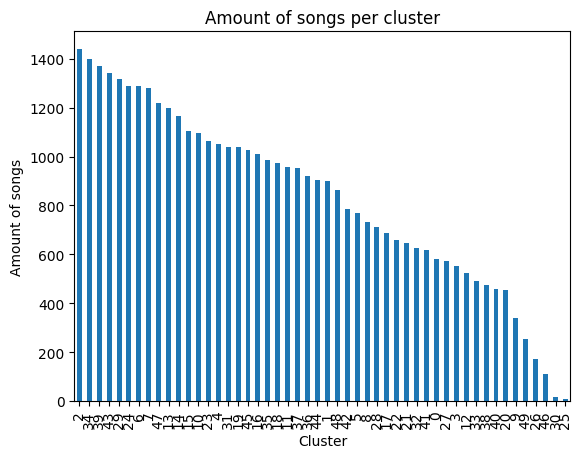

In [22]:
scaled['cluster']= kmodel

data['cluster'].value_counts().plot(kind='bar')
plt.xlabel('Cluster')
plt.ylabel('Amount of songs')
plt.title('Amount of songs per cluster')
plt.show()



In [23]:
#save above info to csv file
data.to_csv('C:/Users/gulie/cluster_data.csv')
#df.to_csv('C:/Users/gulie/cluster_df.csv')

In [24]:
feats = ['danceability', 'instrumentalness', 'energy', 'speechiness', 'explicit', 'valence', 'acousticness', 'popularity', 'liveness', 'loudness', 'tempo', 'year']
clues = data[feats]

In [25]:
#sampling cluster
blues_clues = 16
clues = scaled[data['cluster'] == blues_clues]
clues[['title', 'artist', 'cluster', 'popular', 'id']].sort_values('popular').sample(30).sort_values('popular', ascending=False)

,title,artist,cluster,popular,id
12175,Hola - Remix,"Dalex, Lenny Tavárez, Chencho Corleone, Juhn, ...",16,83,5stPVcRqb4qixbafP9e8lt
3056,Drag Me Down,One Direction,16,81,2K87XMYnUMqLcX3zvtAF4G
3553,Wolves,"Selena Gomez, Marshmello",16,80,0tBbt8CrmxbjRP0pueQkyU
3284,This Is What You Came For (feat. Rihanna),"Calvin Harris, Rihanna",16,79,0azC730Exh71aQlOt9Zj3y
3223,Desperado,Rihanna,16,78,4mCf3vQf7z0Yseo0RxAi3V
12425,Graveyard,Halsey,16,77,2ufmtcIFdFpuUYBPXK5f67
3057,My House,Flo Rida,16,76,6Knv6wdA0luoMUuuoYi2i1
20321,DNA,BTS,16,75,6Z7m5DLNPOaPg9T6nXK0rQ
16204,I Miss You (feat. Julia Michaels),"Clean Bandit, Julia Michaels",16,74,0Ult84lvFuqNvbyXwyRQ58
7624,Again (feat. XXXTENTACION),"Noah Cyrus, XXXTENTACION",16,72,2S2od3hT7ceytw7d1pTRuE


array([[<AxesSubplot: xlabel='danceability', ylabel='danceability'>,
        <AxesSubplot: xlabel='instrumentalness', ylabel='danceability'>,
        <AxesSubplot: xlabel='energy', ylabel='danceability'>,
        <AxesSubplot: xlabel='speechiness', ylabel='danceability'>,
        <AxesSubplot: xlabel='valence', ylabel='danceability'>,
        <AxesSubplot: xlabel='acousticness', ylabel='danceability'>,
        <AxesSubplot: xlabel='popularity', ylabel='danceability'>,
        <AxesSubplot: xlabel='liveness', ylabel='danceability'>,
        <AxesSubplot: xlabel='loudness', ylabel='danceability'>,
        <AxesSubplot: xlabel='tempo', ylabel='danceability'>],
       [<AxesSubplot: xlabel='danceability', ylabel='instrumentalness'>,
        <AxesSubplot: xlabel='instrumentalness', ylabel='instrumentalness'>,
        <AxesSubplot: xlabel='energy', ylabel='instrumentalness'>,
        <AxesSubplot: xlabel='speechiness', ylabel='instrumentalness'>,
        <AxesSubplot: xlabel='valence', ylabe

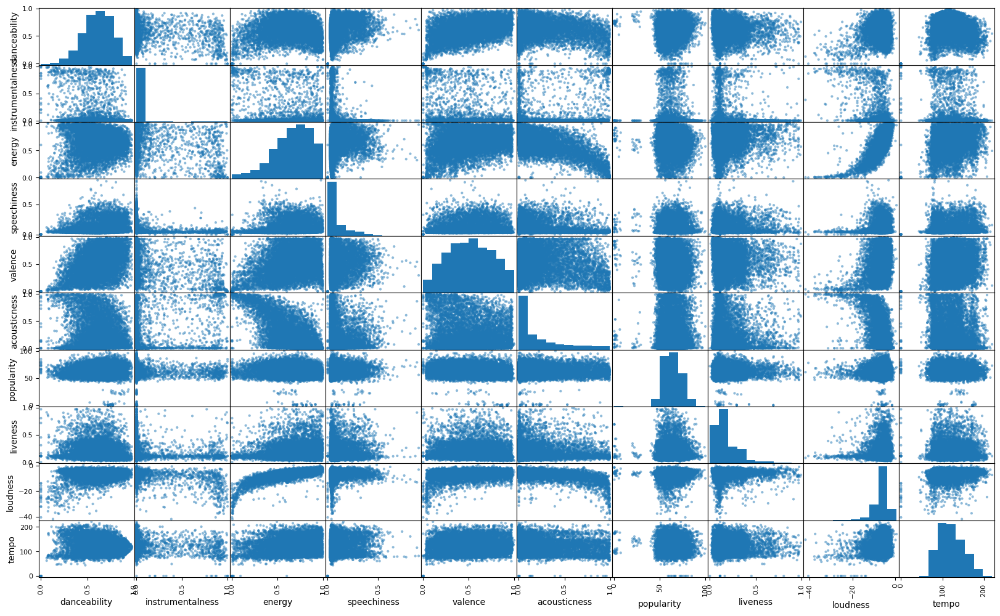

In [26]:
sample_df = data[:10000]
pd.plotting.scatter_matrix(sample_df[['danceability', 'instrumentalness', 'energy', 'speechiness', 'valence', 'acousticness', 'popularity', 'liveness', 'loudness', 'tempo']], figsize=(20,12))

In [27]:
songs = pd.read_csv('cluster_data.csv')


In [28]:
songs.drop(labels = ['danceability', 'instrumentalness', 'energy', 'speechiness', 'explicit', 'valence', 'acousticness', 'liveness', 'loudness', 'tempo', 'release_date', 'key', 'mode', 'duration_ms'], axis=1, inplace =True)
songs.drop(columns= songs.columns[0], axis=1, inplace=True)
songs.head(10)

,Unnamed: 0,year,artists,id,name,popularity,genres,cluster
0,15606,2000,Coldplay,3AJwUDP919kvQ9QcozQPxg,Yellow,84,"permanent wave, pop",15
1,15607,2000,OutKast,0I3q5fE6wg7LIfHGngUTnV,Ms. Jackson,80,"atl hip hop, dirty south rap, hip hop, rap, so...",0
2,15608,2000,Linkin Park,60a0Rd6pjrkxjPbaKzXjfq,In the End,84,"alternative metal, nu metal, post-grunge, rap ...",16
3,15609,2000,3 Doors Down,6ZOBP3NvffbU4SZcrnt1k6,Kryptonite,78,"alternative metal, nu metal, pop rock, post-gr...",19
4,15610,2000,Eminem,3yfqSUWxFvZELEM4PmlwIR,The Real Slim Shady,80,"detroit hip hop, hip hop, rap",0
5,15611,2000,Disturbed,40rvBMQizxkIqnjPdEWY1v,Down with the Sickness,76,"alternative metal, nu metal, rap metal",0
6,15612,2000,"Nelly, City Spud",3Gf5nttwcX9aaSQXRWidEZ,Ride Wit Me,74,[],0
7,15613,2000,"Eminem, Dido",3UmaczJpikHgJFyBTAJVoz,Stan,78,[],0
8,15614,2000,*NSYNC,62bOmKYxYg7dhrC6gH9vFn,Bye Bye Bye,71,"boy band, dance pop, europop, pop",19
9,15615,2000,Travis Tritt,3oW6SWwGqiZSPTiAp7ZQoH,It's A Great Day To Be Alive,70,"contemporary country, country, country road, c...",6


In [29]:
#songs[:5]=songs[:5].apply(lambda x: x.replace('"', ''))
#songs['genres']=songs.genres.apply(lambda x: x.strip(" ' "))
#songs['genres'] = songs.genres.str.replace('"', '')
#songs.head(10)
songs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41450 entries, 0 to 41449
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  41450 non-null  int64 
 1   year        41450 non-null  int64 
 2   artists     41450 non-null  object
 3   id          41450 non-null  object
 4   name        41450 non-null  object
 5   popularity  41450 non-null  int64 
 6   genres      41450 non-null  object
 7   cluster     41450 non-null  int64 
dtypes: int64(4), object(4)
memory usage: 2.5+ MB


In [30]:
#Recommender using song IDs
import ipywidgets as widgets
from ipywidgets import widgets, interact
import time
#song_id = input('Type the id of your favorite song/s: ').strip().split(',')
text_out =widgets.Text(disabled = True, description = 'Title:')
text_in = widgets.Text(placeholder='Type song', description='Song:', disabled=False)
button = widgets.Button(description="Enter")
btn = widgets.Button(description = 'Click Me!')
out = widgets.Output()




#button.on_click(bind)
song_id = text_out.value
display(text_in)
#text_out.update
#display()

#display(box)



#text_out.update
#display()
def fun(b):
    song_id = text_in.value
    faves = songs[songs.name.isin([song_id])]
    clust = list(faves['cluster'])
    clustered = {}
    for i in clust:
        clustered[i] = clust.count(i)   
    fave_cluster = [(l, m) for l, m in sorted(clustered.items(), key=lambda item: item[1])][0][0]
    print('Favorite cluster: ', fave_cluster)
    recommendation = songs[songs.cluster == fave_cluster].sort_values('popularity', ascending=False)
    display(recommendation.head(10))

def bind(sender):
    text_out.value = text_in.value

    
    
def results(sender):   
    out.clear_output()

    with out:
        
        while True:
            try:
                fun('b')
                break
            except IndexError:
                print("Invalid song name, try 'Stan' ")
                break

def event(change):
    results(change.new)
#def recommend(c):
    #recommendation = songs[songs.cluster == fave_cluster].sort_values('popularity', ascending=False)
    #display(recommendation.head(10))
#text_out.observe(event, names='value')    
button.on_click(bind)   
display(text_out, button)

Text(value='', description='Song:', placeholder='Type song')

Text(value='', description='Title:', disabled=True)

Button(description='Enter', style=ButtonStyle())

In [31]:
btn.on_click(results) 
#with out:
#    print('Favorite cluster: ', fave_cluster)
#    display(recommendation.head(10))
        
       
        
display(btn,out)


Button(description='Click Me!', style=ButtonStyle())

Output()

# Song Recommendations ↓

## Song Name Hints

#### Press 'Click Me' to get recommendations

#### If no recommendations given, choose a song title from 'Song Name Hints' ↓

#### Type the name of your favorite song in the textbox 'Song', then click 'Enter'

import session_info
session_info.show()

#Recommender using song names
import ipywidgets as widgets
#song_name = input('Type song name: ').strip().split(',')
button = widgets.Button(description='Search', disabled=False,tooltip='Click me')
display(button)

song_name = widgets.Text(placeholder='Type something',description='String:',disabled=False)
display(song_name)
song_name = song_name.value


favors = songs[songs.name.isin([song_name])]

name_clust = list(favors['cluster'])
cluster_name= {}
for j in name_clust:
    cluster_name[j] = name_clust.count(j)

#get most frequent cluster    
name_cluster =[(n, k) for n, k in sorted(cluster_name.items(), key=lambda item: item[1])][0][0]


print('Favorite cluster: ', name_cluster)

song_recs = songs[songs.cluster == name_cluster].sort_values('popularity', ascending=False)

song_recs.head(10)

#Recommender using artists name

artist_name = input('Type artist name: ').strip().split(',')

artist = songs[songs.artists.isin(artist_name)]

artist_clust = list(artist['cluster'])
cluster_artist = {}
for f in artist_clust:
    cluster_artist[f] = artist_clust.count(f)

    
artist_cluster =[(d, g) for d, g in sorted(cluster_artist.items(), key=lambda item: item[1])][0][0]


print('Favorite cluster: ', artist_cluster)

artist_recs = songs[songs.cluster == artist_cluster].sort_values('popularity', ascending=False)

artist_recs.head(10)

## Scatter Plot of Song Clusters

## Heat Map of Song Features

## Number of Songs per Cluster